# Decision Tree

Prepare libraries and read files

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn

DF_train = pd.read_csv('archive/Train.csv')
DF_test = pd.read_csv('archive/Test.csv')


## Experiment 1
Dropping all columns with NaN/Null values

In [2]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

df_train.dropna(inplace=True)
df_test.dropna(inplace=True)

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":
            X[i] = X[i].apply(lambda x: int(x[-1]))
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

df_train['Age'] = df_train['Age'].apply(lambda x: 1 if x >= 18 and x < 30 else (2 if x >= 30 and x < 40 else (3 if x >= 40 and x < 53 else 4)))
df_test['Age'] = df_test['Age'].apply(lambda x: 1 if x >= 18 and x < 30 else (2 if x >= 30 and x < 40 else (3 if x >= 40 and x < 53 else 4)))
#print(df_train)

#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)

print("--- %s seconds ---" % (time.time() - start_time))

from sklearn import tree
import graphviz
from graphviz import Source

Source(tree.export_graphviz(dt, out_file=None))

Accuracy = 0.3045496750232126
--- 0.01759934425354004 seconds ---


We realised that the accuracy is very low, but the model took the lest time to be trained. (Graph seems to be very big, so we won't be printing it anymore until we do the changes in hyperparameters of our model)

## Experiment 2 
Dropping columns with NaN/Null values in ['Gender', 'Profession', 'Ever_Married', 'Spending_Score', 'Graduated'] and added mean values in ['Age', 'Work_Experience', 'Family_Size']
We chose to fill the NaN values in 'Age', 'Work Experience', 'Family_Size' with their mean values, because they were originally numbers; the other features were encoded by us.

In [3]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Gender', 'Profession', 'Ever_Married', 'Spending_Score', 'Graduated', 'Var_1']:
    df_train.dropna(subset=[i], how='all', inplace=True)
    df_test.dropna(subset=[i], how='all', inplace=True)

for i in ['Age', 'Work_Experience', 'Family_Size']:
    V1 = df_train[i].mean()
    V2 = df_test[i].mean()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":
            X[i] = X[i].apply(lambda x: int(x[-1]))
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

df_train['Age'] = df_train['Age'].apply(lambda x: 1 if x >= 18 and x < 30 else (2 if x >= 30 and x < 40 else (3 if x >= 40 and x < 53 else 4)))
df_test['Age'] = df_test['Age'].apply(lambda x: 1 if x >= 18 and x < 30 else (2 if x >= 30 and x < 40 else (3 if x >= 40 and x < 53 else 4)))
#print(df_train)

#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)

print("--- %s seconds ---" % (time.time() - start_time))

Accuracy = 0.2909967845659164
--- 0.019050121307373047 seconds ---


Accuracy dropped, thus we decided to experiment further

## Experiment  3
Changed NaN in ['Age', 'Work_Experience', 'Family_Size'] to their mode (the value with the highest frequency, thus the highest probability), and all other NaN to -1. We chose to change the NaN value of 'Age', 'Work Experience' and 'Family Size' to mode, because it is illogical for them to be -1

In [4]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)

df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":
            
            X[i] = X[i].apply(lambda x: int(x[-1]) if (x is not None) else X[i].dropna())
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

df_train['Age'] = df_train['Age'].apply(lambda x: 1 if x >= 18 and x < 30 else (2 if x >= 30 and x < 40 else (3 if x >= 40 and x < 53 else 4)))
df_test['Age'] = df_test['Age'].apply(lambda x: 1 if x >= 18 and x < 30 else (2 if x >= 30 and x < 40 else (3 if x >= 40 and x < 53 else 4)))
#print(df_train)

#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)

print("--- %s seconds ---" % (time.time() - start_time))

Accuracy = 0.3018652455272174
--- 0.020438194274902344 seconds ---


Accuracy improved, but took longer time to process.

## Experiment 4
Grouping age into 4 categories/groups (1 = 18 to 30; 2 = 30 to 40; 3 = 40 to 53; 4 = 53 to 89)
<p>
Our splitting of the age groups is according to the description given from df_train.describe()<br/>
[count    8068.000000<br/>
mean       43.466906<br/>
std        16.711696<br/>
min        18.000000<br/>
25%        30.000000<br/>
50%        40.000000<br/>
75%        53.000000<br/>
max        89.000000]
</p>

In [5]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

print(df_train['Age'].describe())

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)

df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":
            X[i] = X[i].apply(lambda x: int(x[-1]) if (x is not None) else X[i].dropna())
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

df_train['Age'] = df_train['Age'].apply(lambda x: 1 if x >= 18 and x < 30 else (2 if x >= 30 and x < 40 else (3 if x >= 40 and x < 53 else 4)))
df_test['Age'] = df_test['Age'].apply(lambda x: 1 if x >= 18 and x < 30 else (2 if x >= 30 and x < 40 else (3 if x >= 40 and x < 53 else 4)))
#print(df_train)

#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)

print("--- %s seconds ---" % (time.time() - start_time))

count    8068.000000
mean       43.466906
std        16.711696
min        18.000000
25%        30.000000
50%        40.000000
75%        53.000000
max        89.000000
Name: Age, dtype: float64
Accuracy = 0.3018652455272174
--- 0.02100992202758789 seconds ---


<p>Accuracy did not change, but took even longer time.<br/>
Thus, we tried to categorise it into 3 category instead, hoping to cut down the time used.
</p>

## Experiment 5

<p>Grouping age into 3 categories/groups (1 = 18 to 40; 2 = 40 to 65; 3 = 65 to 89)</p>

In [6]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)

df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":
            X[i] = X[i].apply(lambda x: int(x[-1]) if (x is not None) else X[i].dropna())
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

df_train['Age'] = df_train['Age'].apply(lambda x: 1 if x >= 18 and x < 40 else (2 if x >= 40 and x < 65 else 3))
df_test['Age'] = df_test['Age'].apply(lambda x: 1 if x >= 18 and x < 40 else (2 if x >= 40 and x < 65 else 3))
#print(df_train)

x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)

print("--- %s seconds ---" % (time.time() - start_time))

Accuracy = 0.30300723258469736
--- 0.018411874771118164 seconds ---


Time dropped but accuracy dropped as well, so we decided to try normalising the age

## Experiment 6
Nomilised age

In [7]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)
    
df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":
            X[i] = X[i].apply(lambda x: int(x[-1]) if (x is not None) else X[i].dropna())
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

for word in ['Age']:
    temp_mean_train = df_train[word].mean()
    temp_std_train = df_train[word].std()
    df_train[word] = (df_train[word] - temp_mean_train)/temp_std_train
    
    temp_mean_test = df_test[word].mean()
    temp_std_test = df_test[word].std()
    df_test[word] = (df_test[word] - temp_mean_test)/temp_std_test

#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)

print("--- %s seconds ---" % (time.time() - start_time))

Accuracy = 0.300342596117244
--- 0.022279977798461914 seconds ---


Suprisingly, the accuracy improved, it's the highest so far. However, time taken increased slightly as well

## Experiment 7
We tried to nomalise 'Age', 'Work Experience' and 'Family size', as we see that there is improvement in accuracy after we normalised 'Age' in Experiment 6

In [8]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)
    
df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":  
            X[i] = X[i].apply(lambda x: int(x[-1]) if (x is not None) else X[i].dropna())
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

#Nomalisation
for word in ['Age','Family_Size','Work_Experience']:
    temp_mean_train = df_train[word].mean()
    temp_std_train = df_train[word].std()
    df_train[word] = (df_train[word] - temp_mean_train)/temp_std_train
    
    temp_mean_test = df_test[word].mean()
    temp_std_test = df_test[word].std()
    df_test[word] = (df_test[word] - temp_mean_test)/temp_std_test


#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)

print("--- %s seconds ---" % (time.time() - start_time))

Accuracy = 0.3011039208222307
--- 0.024708986282348633 seconds ---


Unexpectedly, accuracy dropped, and model took longer to be trained (longest time needed so far)

## Experiment 8
We changed our focus to configuring the model itself, tuning the hyperparameter (max_depth = 5) of DecisionTreeClassifier with age normalisation (because normalising age gave us the highest accuracy)

Accuracy = 0.3448800913589646
--- 0.014053821563720703 seconds ---


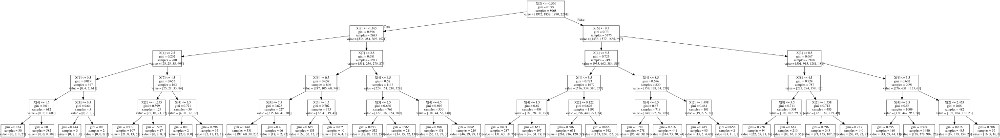

In [9]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)
    
df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

#exit()

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":  
            X[i] = X[i].apply(lambda x: int(x[-1]) if (x is not None) else X[i].dropna())
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

#Nomalisation
for word in ['Age']:
    temp_mean_train = df_train[word].mean()
    temp_std_train = df_train[word].std()
    df_train[word] = (df_train[word] - temp_mean_train)/temp_std_train
    
    temp_mean_test = df_test[word].mean()
    temp_std_test = df_test[word].std()
    df_test[word] = (df_test[word] - temp_mean_test)/temp_std_test


#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(criterion = 'gini',
                            splitter = 'best',
                            max_depth = 5,
                            min_samples_split = 2,
                            min_samples_leaf = 1,
                            min_weight_fraction_leaf = 0.0,
                            max_features = None, # ??
                            random_state = 42,
                            max_leaf_nodes = None,
                            min_impurity_decrease = 0.0,
                            class_weight = None, # ??
                            ccp_alpha = 0.0)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)
print("--- %s seconds ---" % (time.time() - start_time))

from sklearn import tree
import graphviz
from graphviz import Source

Source(tree.export_graphviz(dt, out_file=None))

Accuracy improve significantly, and took relatively short time to be trained. Our best result.

## Experiment 9
Trying with critirion=Entropy and max_depth = 5 with age normalisation (because normalising age gave us the highest accuracy)

In [10]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)
    
df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":  
            X[i] = X[i].apply(lambda x: int(x[-1]) if (x is not None) else X[i].dropna())
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

#Nomalisation
for word in ['Age']:
    temp_mean_train = df_train[word].mean()
    temp_std_train = df_train[word].std()
    df_train[word] = (df_train[word] - temp_mean_train)/temp_std_train
    
    temp_mean_test = df_test[word].mean()
    temp_std_test = df_test[word].std()
    df_test[word] = (df_test[word] - temp_mean_test)/temp_std_test


#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(criterion = 'entropy',
                            splitter = 'best',
                            max_depth = None,
                            min_samples_split = 2,
                            min_samples_leaf = 1,
                            min_weight_fraction_leaf = 0.0,
                            max_features = None, # ??
                            random_state = 42,
                            max_leaf_nodes = None,
                            min_impurity_decrease = 0.0,
                            class_weight = None, # ??
                            ccp_alpha = 0.0)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)
print("--- %s seconds ---" % (time.time() - start_time))

from sklearn import tree
import graphviz
from graphviz import Source

Source(tree.export_graphviz(dt, out_file=None))

Accuracy = 0.31062047963456413
--- 0.028162002563476562 seconds ---


Accuracy dropped, and time used to train model increase a lot. Longest time used.

## Experiment 10
We increased the min_samples_split = 300, min_samples_leaf = 300. In order to avoid overfitting (over splitting of branches and leaves).

Accuracy = 0.34031214312904456
--- 0.013883829116821289 seconds ---


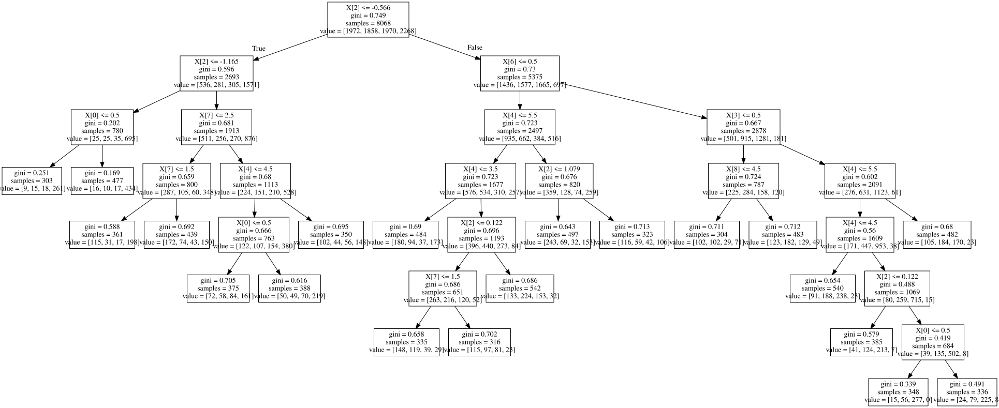

In [11]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)
    
df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

#exit()

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":  
            X[i] = X[i].apply(lambda x: int(x[-1]) if (x is not None) else X[i].dropna())
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

#Nomalisation
for word in ['Age']:
    temp_mean_train = df_train[word].mean()
    temp_std_train = df_train[word].std()
    df_train[word] = (df_train[word] - temp_mean_train)/temp_std_train
    
    temp_mean_test = df_test[word].mean()
    temp_std_test = df_test[word].std()
    df_test[word] = (df_test[word] - temp_mean_test)/temp_std_test


#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(criterion = 'gini',
                            splitter = 'best',
                            max_depth = None,
                            min_samples_split = 300,
                            min_samples_leaf = 300,
                            min_weight_fraction_leaf = 0.0,
                            max_features = None, # ??
                            random_state = 42,
                            max_leaf_nodes = None,
                            min_impurity_decrease = 0.0,
                            class_weight = None, # ??
                            ccp_alpha = 0.0)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)
print("--- %s seconds ---" % (time.time() - start_time))

from sklearn import tree
import graphviz
from graphviz import Source

Source(tree.export_graphviz(dt, out_file=None))

Accuracy considered high (2nd highest we've got), and time used to train model dropped significantly (lowest time spent)

## Experiment 12
We changed the critirion to 'entropy' with increased min_samples_split = 300, min_samples_leaf = 300. In order to avoid overfitting (over splitting of branches and leaves).

Accuracy = 0.34031214312904456
--- 0.011566877365112305 seconds ---


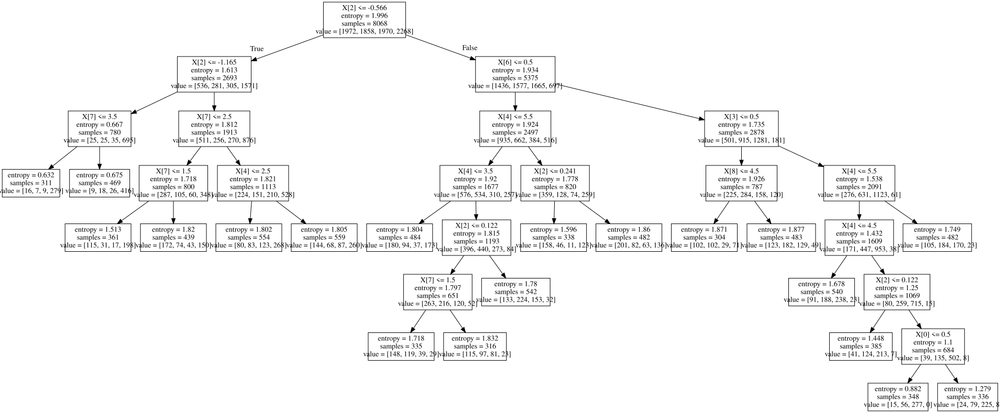

In [12]:
df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)
    
df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

#exit()

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":  
            X[i] = X[i].apply(lambda x: int(x[-1]) if (x is not None) else X[i].dropna())
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

#Nomalisation
for word in ['Age']:
    temp_mean_train = df_train[word].mean()
    temp_std_train = df_train[word].std()
    df_train[word] = (df_train[word] - temp_mean_train)/temp_std_train
    
    temp_mean_test = df_test[word].mean()
    temp_std_test = df_test[word].std()
    df_test[word] = (df_test[word] - temp_mean_test)/temp_std_test


#exit()
x_train = df_train.iloc[:,0:-1]
y_train = df_train.iloc[:,-1]
x_test = df_test.iloc[:,0:-1]
y_test = df_test.iloc[:,-1]

from sklearn.tree import DecisionTreeClassifier

import time
start_time = time.time()

dt = DecisionTreeClassifier(criterion = 'entropy',
                            splitter = 'best',
                            max_depth = None,
                            min_samples_split = 300,
                            min_samples_leaf = 300,
                            min_weight_fraction_leaf = 0.0,
                            max_features = None, # ??
                            random_state = 42,
                            max_leaf_nodes = None,
                            min_impurity_decrease = 0.0,
                            class_weight = None, # ??
                            ccp_alpha = 0.0)
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import accuracy_score
AS = accuracy_score(y_test, y_pred)
print("Accuracy =", AS)
print("--- %s seconds ---" % (time.time() - start_time))

from sklearn import tree
import graphviz
from graphviz import Source

Source(tree.export_graphviz(dt, out_file=None))

Accuracy same as Experiment 10, but time took lesser to complete training

## Experiment 12
Correlation Coefficient

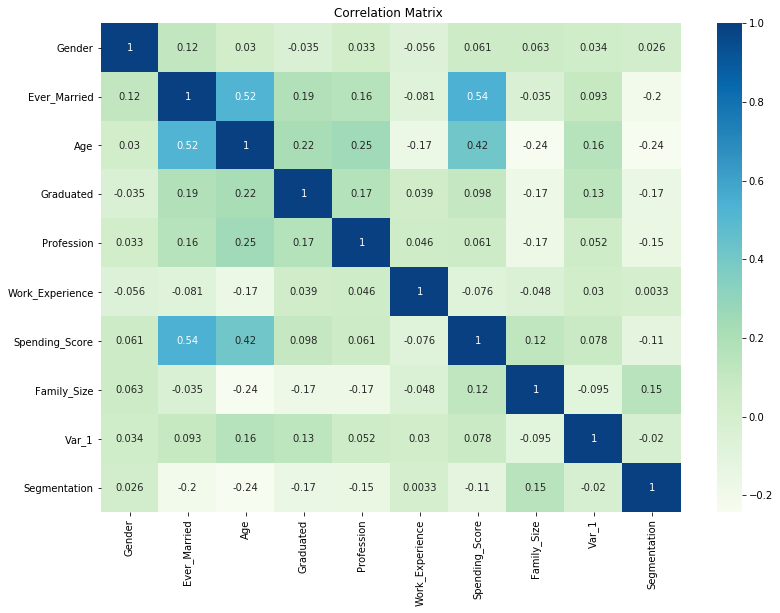

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import seaborn

DF_train = pd.read_csv('archive/Train.csv')
DF_test = pd.read_csv('archive/Test.csv')

df_train = DF_train.iloc[:,1:11]
df_test = DF_test.iloc[:,1:11]

for i in ['Age', 'Family_Size', 'Work_Experience']:
    V1 = df_train[i].mode()
    V2 = df_test[i].mode()
    df_train[i].fillna(value=V1, inplace=True)
    df_test[i].fillna(value=V2, inplace=True)
    
df_train.fillna(value="-1", inplace=True)
df_test.fillna(value="-1", inplace=True)

myDict = {
    "Yes" : 1,
    "No" : 0,
    "Male" : 1,
    "Female" : 0,
    "Low" : 0,
    "Average" : 1,
    "High" : 2,
    "Engineer" : 1,
    "Healthcare" : 2,
    "Executive" : 3,
    "Doctor" : 4,
    "Artist" : 5,
    "Lawyer" : 6,
    "Entertainment" : 7,
    "Homemaker" : 8,
    "Marketing" : 9,
    "-1" : -1,
    "A" : 1,
    "B" : 2,
    "C" : 3,
    "D" : 4
}

def outcomeTrans(X):
    cols = list(X)
    for i in cols:
        if i == "Age" or i == "Work_Experience" or i == "Family_Size":
            X[i] = X[i].astype(int)
        elif i == "Var_1":  
            X[i] = X[i].apply(lambda x: int(x[-1]))
        else:
            X[i] = X[i].map(myDict)
    return X

outcomeTrans(df_train)
outcomeTrans(df_test)

#Nomalisation
for word in ['Age']:
    temp_mean_train = df_train[word].mean()
    temp_std_train = df_train[word].std()
    df_train[word] = (df_train[word] - temp_mean_train)/temp_std_train
    
    temp_mean_test = df_test[word].mean()
    temp_std_test = df_test[word].std()
    df_test[word] = (df_test[word] - temp_mean_test)/temp_std_test

corr_mat = df_train.corr()
plt.figure(figsize=(13,9))
ax = seaborn.heatmap(data=corr_mat, annot=True,
            cmap='GnBu')
plt.title('Correlation Matrix ')
plt.show()

Feature Selection after correlation coefficient check
chosen columns are ['Ever_Married','Age','Graduated','Profession','Spending_Score','Family_Size']

/Users/Jian158/opt/anaconda3/envs/pythonSA/lib/python3.6/site-packages/sklearn/tree/_classes.py:310: FutureWarning: The min_impurity_split parameter is deprecated. Its default value has changed from 1e-7 to 0 in version 0.23, and it will be removed in 0.25. Use the min_impurity_decrease parameter instead.
  FutureWarning)


0.3310120705663881


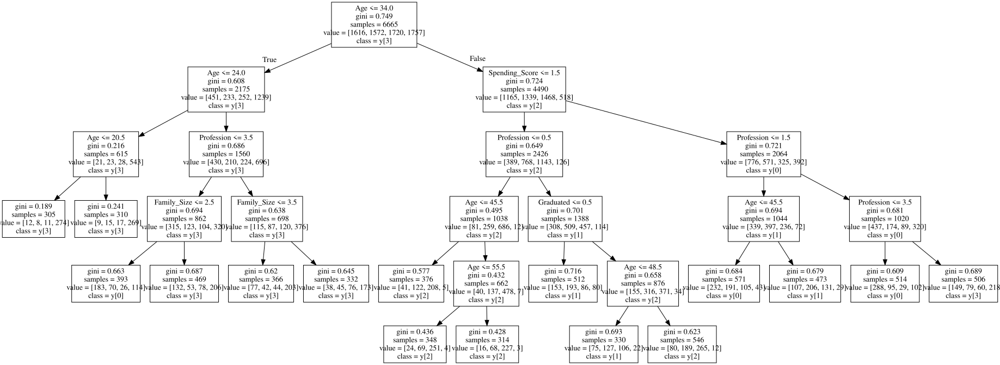

In [14]:
# %%
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn import tree
from graphviz import Source

# %%
df_train = pd.read_csv('archive/train.csv')
df_test = pd.read_csv('archive/test.csv')

#%% df_train['Profession'].unique()
temp = df_train.corr()

df_train.dropna(axis=0, how='any', inplace=True)
df_test.dropna(axis=0, how='any', inplace=True)

#%% Categorize
for word in ['Gender','Ever_Married','Graduated','Profession','Spending_Score','Var_1','Segmentation']:
    df_train[word] = df_train[word].astype('category')
    df_train[word] = df_train[word].cat.codes
    df_test[word] = df_test[word].astype('category')
    df_test[word] = df_test[word].cat.codes

#%% Data
X_train = df_train[['Ever_Married','Age','Graduated','Profession','Spending_Score','Family_Size']]
y_train = df_train[['Segmentation']]

X_test = df_test[['Ever_Married','Age','Graduated','Profession','Spending_Score','Family_Size']]
y_test = df_test[['Segmentation']]

#%% Build a tree
tree_1 = DecisionTreeClassifier(criterion = 'gini',
                                splitter = 'best',
                                max_depth = 10,
                                min_samples_split = 300,
                                min_samples_leaf = 300,
                                min_weight_fraction_leaf = 0.0,
                                max_features = None, # ??
                                random_state = 42,
                                max_leaf_nodes = None,
                                min_impurity_decrease = 0.0,
                                min_impurity_split = 0,
                                class_weight = None, # ??
                                ccp_alpha = 0.0).fit(X_train,y_train)

#%% 
#print(accuracy_score(y_train, tree_1.predict(X_train)))
print(accuracy_score(y_test, tree_1.predict(X_test)))

Source(tree.export_graphviz(tree_1, out_file=None, class_names=True, feature_names= X_train.columns))

The correlation coefficient between any two variables in the dataset calculated are low; sufficiently low enough for us to believe that the variables are almost independent from each other. Moreover, the resulted accuracy, after removing some of the correlated features, neither increase nor decrease significantly. Therefore, it is advisable that all the features in the model should be included during training of the models.